# MedSigLIP gate for normal / negative-box FPR

**Purpose.** Evaluate whether `google/medsiglip-448` can reject false-positive PGA-UNet masks produced from random boxes on lesion-free X-rays.

MedSigLIP is an image-text encoder, **not a segmentation model**. Here it is used only as a zero-shot box-crop gate after PGA-UNet.

The notebook reports all of the following together:

1. PGA box-level FPR before and after the MedSigLIP gate.
2. Image-level FPR (at least one false positive among sampled boxes).
3. Pixel-level false-positive fraction.
4. Positive-box retention on held-out lesion boxes.

A gate is useful only if it lowers FPR without unacceptable loss of positive-box retention. Do not report FPR reduction alone.

Model card: https://developers.google.com/health-ai-developer-foundations/medsiglip/model-card

---
**Audit revision (12/09/2026).** This version applies the fixes required by
`02_Danh_gia_notebook_MedSigLIP.md` before treating any number below as a
result for the paper:
- Positive cohort is now built from `PromptSegmentationDataset.all_samples`
  (polygon-only), not from a parser that also counts rectangles/other
  shapes (Section 3 / A).
- `letterbox()` now uses `cv2.INTER_LINEAR` and box rasterization clips
  before truncating with `int()`, matching the PGA dataset code
  (Section 4 / B).
- Reproducibility metadata (repo commit, checkpoint hash, library
  versions), duplicate-image checks, incremental result saving, and a
  paired cluster-bootstrap CI for ΔFPR were added (Sections 5, 7, 8).
- Pixel-fraction naming was clarified to state its exact scope
  (Section 6 / D).
None of this reruns MedSigLIP; only bookkeeping, the positive cohort, and
the PGA preprocessing paths changed. See the audit file for full context.


## 1. Environment and data setup

The BTXRD Google Drive ID and project layout below are copied from `pga-train-512.ipynb`.

The supplied ZIP may contain only lesion-positive train/validation/test data. If normal images are stored separately, set `NEGATIVE_IMAGE_DIR` in Section 2 or provide their authorized Google Drive ID. This notebook deliberately does not invent an unavailable dataset ID.


In [1]:
# Colab/Kaggle setup
import os, sys, subprocess
from pathlib import Path

BASE = Path("/kaggle/working" if Path("/kaggle/working").exists() else "/content")
os.chdir(BASE)
print("Working directory:", BASE)

# Install runtime dependencies.
subprocess.run([
    sys.executable, "-m", "pip", "install", "-q",
    "transformers>=4.50.0", "huggingface_hub>=0.28.0",
    "accelerate>=1.2.0", "safetensors", "gdown",
    "opencv-python-headless", "pandas", "scikit-learn",
    "scipy", "matplotlib", "tqdm", "Pillow"
], check=True)

# Clone the same repository used by pga-train-512.ipynb.
repo_dir = BASE / "PGA_Unet2D"
if not repo_dir.exists():
    subprocess.run([
        "git", "clone", "--branch", "main", "--single-branch",
        "https://github.com/ThongLuc2k3/PGA_Unet2D.git", str(repo_dir)
    ], check=True)

# AUDIT Section 7 (E.1): record the exact commit so results can be traced
# back to reproducible code. "git clone main" alone does not pin a version;
# print + keep the hash so it can be saved alongside any results later.
_commit_proc = subprocess.run(
    ["git", "-C", str(repo_dir), "rev-parse", "HEAD"],
    check=True, capture_output=True, text=True,
)
REPO_COMMIT = _commit_proc.stdout.strip()
print("PGA_Unet2D commit:", REPO_COMMIT)

# Download the same processed BTXRD ZIP if it is not present.
BTXRD_GDRIVE_ID = "1Ep3w8GujpCQ5Qb6nlXKxXhsCxlc3k8gx"
zip_path = BASE / "dataset_BTXRD.zip"
dataset_src = BASE / "dataset_BTXRD"
if not dataset_src.exists():
    if not zip_path.exists():
        subprocess.run([
            "gdown", "--id", BTXRD_GDRIVE_ID, "-O", str(zip_path)
        ], check=True)
    subprocess.run(["unzip", "-oq", str(zip_path), "-d", str(BASE)], check=True)

project_dir = repo_dir / "Source" / "Prompt-Guided-XRay-Segmentation"
dataset_dst = project_dir / "dataset_BTXRD"
if dataset_src.exists() and not dataset_dst.exists():
    dataset_src.rename(dataset_dst)

os.chdir(project_dir)
sys.path.insert(0, str(project_dir))
print("Project:", project_dir)
print("Dataset:", dataset_dst)
print("CUDA check will run after importing torch in the next cell.")


Working directory: /kaggle/working


Cloning into '/kaggle/working/PGA_Unet2D'...


PGA_Unet2D commit: caeea6c0536bf9b13af0ee56aee2b4c9c6d5cd59


/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:139: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1Ep3w8GujpCQ5Qb6nlXKxXhsCxlc3k8gx
From (redirected): https://drive.google.com/uc?id=1Ep3w8GujpCQ5Qb6nlXKxXhsCxlc3k8gx&confirm=t&uuid=170d5e37-b6bc-42db-8e2c-daa6bdce0695
To: /kaggle/working/dataset_BTXRD.zip
100%|██████████| 1.71G/1.71G [00:20<00:00, 83.1MB/s]


Project: /kaggle/working/PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation
Dataset: /kaggle/working/PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation/dataset_BTXRD
CUDA check will run after importing torch in the next cell.


## 2. Configuration

You must confirm the checkpoint and the lesion-free image directory.

Expected positive-data layout, inherited from the training notebook:

```
dataset_BTXRD/
  train/images/
  train/annotations/
  val/images/
  val/annotations/
  test/images/
  test/annotations/
```

The notebook searches several common names for lesion-free images. If none exists, set `NEGATIVE_IMAGE_DIR` explicitly.


In [2]:
from pathlib import Path

# Core paths
DATASET_ROOT = Path("dataset_BTXRD")
VAL_IMAGE_DIR = DATASET_ROOT / "val" / "images"
VAL_ANN_DIR   = DATASET_ROOT / "val" / "annotations"
TEST_IMAGE_DIR = DATASET_ROOT / "test" / "images"
TEST_ANN_DIR   = DATASET_ROOT / "test" / "annotations"

# PGA checkpoint: same default as pga-train-512.ipynb.
PGA_CHECKPOINT = Path(
    "checkpoints/pga_unet_center_mixed_x3_shift05_qhead_512_best.pth"
)

# Tải checkpoint PGA-UNet từ Google Drive nếu chưa có sẵn
PGA_GDRIVE_ID = "19WuyMmN9anS3ErDxfMFj8cOIAJYpxfI0"
PGA_CHECKPOINT.parent.mkdir(parents=True, exist_ok=True)

if not PGA_CHECKPOINT.exists() and PGA_GDRIVE_ID:
  subprocess.run(
      ["gdown", "--id", PGA_GDRIVE_ID, "-O", str(PGA_CHECKPOINT)], check=True
  )

# If your actual checkpoint has no QualityHead, set this False and point to it.
USE_QUALITY_HEAD = True
USE_ENCODER_PROMPT = True
PGA_IMG_SIZE = 512
PGA_MASK_THRESHOLD = 0.5
PGA_BATCH_SIZE = 8
MIN_PRED_PIXELS = 1       # non-empty mask definition; also report pixel FPR
N_NEG_BOXES_PER_IMAGE = 50
NEG_BOX_SIDE_RANGE = (0.15, 0.55)  # same range used by the paper's shortlist
RANDOM_SEED = 22120196

# MedSigLIP settings
MEDSIGLIP_ID = "google/medsiglip-448"
MEDSIGLIP_BATCH_SIZE = 8  # lower to 2-4 if GPU memory is insufficient
CROP_CONTEXT_SCALE = 1.25
TARGET_VAL_SENSITIVITY = 0.95

# Zero-shot text ensemble. Do not tune these on the test set.
POSITIVE_TEXTS = [
    "an X-ray showing a bone lesion",
    "an X-ray showing an abnormal bone lesion",
    "an X-ray showing a bone tumor",
    "an X-ray showing a bone fracture",
]
NEGATIVE_TEXTS = [
    "a normal bone X-ray without a lesion",
    "an X-ray showing normal bone anatomy",
    "a bone X-ray without fracture or tumor",
    "an X-ray without an abnormal bone lesion",
]

# Optional speed-limited smoke test. Use None for the real experiment.
MAX_NEG_IMAGES = None
MAX_POS_VAL_BOXES = None
MAX_POS_TEST_BOXES = None

# Normal-image location. The reference notebook does not contain its ID.
# Option A: point directly to an existing authorized folder.
# NEGATIVE_IMAGE_DIR = Path("/content/BTXRD_normal_images")
NEGATIVE_IMAGE_DIR = None
# Option B: paste the authorized Google Drive ZIP ID, then rerun this cell.
NEGATIVE_GDRIVE_ID = "1SDl-TWl2PgNHxr2aABONtbHe605uGaOm"
NEGATIVE_EXTRACT_DIR = BASE / "BTXRD_normal_images"
if NEGATIVE_IMAGE_DIR is None and NEGATIVE_GDRIVE_ID:
    negative_zip = BASE / "BTXRD_normal_images.zip"
    if not negative_zip.exists():
        subprocess.run([
            "gdown", "--id", NEGATIVE_GDRIVE_ID, "-O", str(negative_zip)
        ], check=True)
    NEGATIVE_EXTRACT_DIR.mkdir(parents=True, exist_ok=True)
    subprocess.run([
        "unzip", "-oq", str(negative_zip), "-d", str(NEGATIVE_EXTRACT_DIR)
    ], check=True)
    NEGATIVE_IMAGE_DIR = NEGATIVE_EXTRACT_DIR

negative_candidates = [
    DATASET_ROOT / "negative" / "images",
    DATASET_ROOT / "normal" / "images",
    DATASET_ROOT / "test_negative" / "images",
    DATASET_ROOT / "test" / "normal",
    DATASET_ROOT / "negative_images",
    DATASET_ROOT / "normal_images",
]
if NEGATIVE_IMAGE_DIR is None:
    NEGATIVE_IMAGE_DIR = next((p for p in negative_candidates if p.exists()), None)

print("Validation positives:", VAL_IMAGE_DIR, VAL_ANN_DIR)
print("Test positives:", TEST_IMAGE_DIR, TEST_ANN_DIR)
print("Negative images:", NEGATIVE_IMAGE_DIR)
print("PGA checkpoint:", PGA_CHECKPOINT)

if NEGATIVE_IMAGE_DIR is None:
    raise FileNotFoundError(
        "No lesion-free image directory was found. Set NEGATIVE_IMAGE_DIR to "
        "the authorized BTXRD normal-image folder. The supplied reference "
        "notebook contains no separate Google Drive ID for normal images."
    )
if not PGA_CHECKPOINT.exists():
    raise FileNotFoundError(
        f"Checkpoint not found: {PGA_CHECKPOINT}. Upload it or change PGA_CHECKPOINT."
    )

# AUDIT: single shared results directory so every stage (cohort audit,
# positive scoring, negative evaluation, summary) can save intermediate
# artifacts as soon as they exist, instead of only at the very end
# (see Section 8 on preserving partial work if the run is interrupted).
RESULTS_DIR = Path("results") / "medsiglip_negative_gate"
RESULTS_DIR.mkdir(parents=True, exist_ok=True)
print("Results directory:", RESULTS_DIR.resolve())


/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:139: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=19WuyMmN9anS3ErDxfMFj8cOIAJYpxfI0
To: /kaggle/working/PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation/checkpoints/pga_unet_center_mixed_x3_shift05_qhead_512_best.pth
100%|██████████| 11.9M/11.9M [00:00<00:00, 27.4MB/s]
/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:139: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1SDl-TWl2PgNHxr2aABONtbHe605uGaOm
From (redirected): https://drive.google.com/uc?id=1SDl-TWl2PgNHxr2aABONtbHe605uGaOm&confirm=t&uuid=1441dabf-758d-4137-a71e-e3e823e0a30c
To: /kaggle/working/BTXRD_normal_images.zip
100%|███

Validation positives: dataset_BTXRD/val/images dataset_BTXRD/val/annotations
Test positives: dataset_BTXRD/test/images dataset_BTXRD/test/annotations
Negative images: /kaggle/working/BTXRD_normal_images
PGA checkpoint: checkpoints/pga_unet_center_mixed_x3_shift05_qhead_512_best.pth
Results directory: /kaggle/working/PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation/results/medsiglip_negative_gate


## 3. Load PGA-UNet and MedSigLIP

MedSigLIP weights may require accepting Google's Health AI Developer Foundations terms on Hugging Face. Accept the terms for `google/medsiglip-448`, then provide an HF token if the runtime is not already authenticated.


In [3]:
import os
import getpass
import torch
from huggingface_hub import login
from transformers import AutoModel, AutoProcessor
from models.networks.prompt_unet_2D import PGA_UNet

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

# Read HF_TOKEN from Colab secrets or environment without printing it.
# IMPORTANT: never hardcode the token value itself into this notebook.
# Preferred setup (do this BEFORE running this cell):
#   Colab:  Secrets panel (key icon) -> add secret named HF_TOKEN
#   Kaggle: Add-ons > Secrets -> add secret named HF_TOKEN
#   Local:  export HF_TOKEN=hf_xxx   (in your shell, before starting Jupyter)
hf_token = os.environ.get("HF_TOKEN")
if not hf_token:
    try:
        from google.colab import userdata
        hf_token = userdata.get("HF_TOKEN")
    except Exception:
        hf_token = None
if not hf_token:
    try:
        from kaggle_secrets import UserSecretsClient
        hf_token = UserSecretsClient().get_secret("HF_TOKEN")
    except Exception:
        hf_token = None
if not hf_token:
    # Last resort: prompt interactively so the token is never written to disk.
    hf_token = getpass.getpass(
        "HF_TOKEN not found in env/Colab/Kaggle secrets. "
        "Paste your Hugging Face access token (input hidden): "
    ).strip() or None

if hf_token:
    login(token=hf_token, add_to_git_credential=False)
    print("Hugging Face token loaded.")
else:
    print(
        "No HF_TOKEN provided. Make sure you have also clicked "
        "'Agree and access repository' on "
        "https://huggingface.co/google/medsiglip-448 with the SAME account "
        "that owns this token, otherwise you will still get a 401/403 error."
    )

# --- Load PGA-UNet checkpoint ---
pga = PGA_UNet(
    use_encoder_prompt=USE_ENCODER_PROMPT,
    use_quality_head=USE_QUALITY_HEAD,
).to(DEVICE)
state = torch.load(PGA_CHECKPOINT, map_location=DEVICE)
if isinstance(state, dict) and "state_dict" in state:
    state = state["state_dict"]
# Handle checkpoints saved from DataParallel.
state = {k.removeprefix("module."): v for k, v in state.items()}
pga.load_state_dict(state, strict=True)
pga.eval()

# --- Load MedSigLIP (gated repo: requires accepted license + valid token) ---
processor = AutoProcessor.from_pretrained(MEDSIGLIP_ID, token=hf_token)
medsiglip = AutoModel.from_pretrained(
    MEDSIGLIP_ID,
    token=hf_token,
    torch_dtype=torch.float16 if DEVICE.type == "cuda" else torch.float32,
).to(DEVICE)
medsiglip.eval()

print("Loaded PGA-UNet:", PGA_CHECKPOINT)
print("Loaded MedSigLIP:", MEDSIGLIP_ID)

# AUDIT Section 7 (E.1): pin down exactly what produced any downstream
# numbers -- commit, checkpoint hash, model revision, library versions.
# This does not change any computation; it only records provenance.
import json
import hashlib as _hashlib
import transformers as _transformers

def _sha256_file(path, chunk_size=1 << 20):
    h = _hashlib.sha256()
    with open(path, "rb") as f:
        for chunk in iter(lambda: f.read(chunk_size), b""):
            h.update(chunk)
    return h.hexdigest()

RUN_METADATA = {
    "pga_unet2d_commit": REPO_COMMIT,
    "pga_checkpoint_path": str(PGA_CHECKPOINT),
    "pga_checkpoint_sha256": _sha256_file(PGA_CHECKPOINT),
    "medsiglip_model_id": MEDSIGLIP_ID,
    "transformers_version": _transformers.__version__,
    "torch_version": torch.__version__,
}
print("Run metadata (save this alongside any results):")
for _k, _v in RUN_METADATA.items():
    print(f"  {_k}: {_v}")
with open(RESULTS_DIR / "run_metadata.json", "w", encoding="utf-8") as _f:
    json.dump(RUN_METADATA, _f, indent=2)


Device: cuda
GPU: Tesla T4
Hugging Face token loaded.


preprocessor_config.json:   0%|          | 0.00/360 [00:00<?, ?B/s]

The image processor of type `SiglipImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


config.json:   0%|          | 0.00/879 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/809 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/798k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/455 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

`torch_dtype` is deprecated! Use `dtype` instead!


model.safetensors:   0%|          | 0.00/3.51G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/888 [00:00<?, ?it/s]

Loaded PGA-UNet: checkpoints/pga_unet_center_mixed_x3_shift05_qhead_512_best.pth
Loaded MedSigLIP: google/medsiglip-448
Run metadata (save this alongside any results):
  pga_unet2d_commit: caeea6c0536bf9b13af0ee56aee2b4c9c6d5cd59
  pga_checkpoint_path: checkpoints/pga_unet_center_mixed_x3_shift05_qhead_512_best.pth
  pga_checkpoint_sha256: dcfc23d1bcfa9fef770b487df6d2bac376d0914983b72651f64653f24880896e
  medsiglip_model_id: google/medsiglip-448
  transformers_version: 5.0.0
  torch_version: 2.10.0+cu128


## 4. Image, annotation, prompt, and metric helpers

Annotation parsing supports common LabelMe-style `shapes[].points`, direct `bbox`, and simple COCO-style `annotations[].bbox`. Inspect the printed counts before trusting the experiment.

Images are letterboxed to 512×512 for PGA-UNet. Negative boxes are sampled in that same frame. MedSigLIP receives a crop around each box with configurable context.

**Audit fixes applied in this cell (Section 4 / B):**
- `letterbox()` now resizes with `cv2.INTER_LINEAR` for both the image and
  the Gaussian prompt, matching the PGA dataset code that produced the
  checkpoint (the notebook previously used `cv2.INTER_AREA` for both).
- `gaussian_prompt()` now clips the float box coordinates first and only
  then truncates with `int()`, instead of rounding before clipping.
- `parse_boxes()` now only accepts `shape_type == "polygon"` shapes by
  default (matching the PGA dataset), instead of counting every shape and
  every `bbox`/`annotations[].bbox` regardless of type. The permissive
  behavior is kept as `parse_boxes(..., require_polygon=False)` only for
  debugging/comparison, not for the reported cohort.
- Negative-box rasterization is unchanged: `run_pga_boxes()` already
  rasterizes the sampled box directly without the ×3 expansion that is
  only meant for tight GT polygons (Section 4 recommendation "đối với
  negative box, rasterize trực tiếp box được lấy mẫu").


In [4]:
import json, math, hashlib, random
import cv2
import numpy as np
import pandas as pd
from PIL import Image
from tqdm.auto import tqdm
from scipy.special import expit

IMAGE_EXTS = {".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff"}

def image_files(root: Path):
    return sorted(p for p in Path(root).rglob("*") if p.suffix.lower() in IMAGE_EXTS)

def find_image_by_stem(image_dir: Path, stem: str):
    matches = [p for p in image_files(image_dir) if p.stem == stem]
    return matches[0] if matches else None

def load_gray(path: Path):
    arr = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if arr is None:
        raise ValueError(f"Cannot read image: {path}")
    return arr

def letterbox(array, size=512):
    # AUDIT (Section 4 / B): the PGA dataset code used to produce the
    # checkpoint resizes with cv2.INTER_LINEAR for both the image and the
    # Gaussian prompt. This notebook previously used cv2.INTER_AREA for
    # both, which changes the exact input pixels fed to PGA-UNet.
    h, w = array.shape
    scale = min(size / w, size / h)
    nw, nh = max(1, round(w * scale)), max(1, round(h * scale))
    resized = cv2.resize(array, (nw, nh), interpolation=cv2.INTER_LINEAR)
    canvas = np.zeros((size, size), dtype=array.dtype)
    left, top = (size - nw) // 2, (size - nh) // 2
    canvas[top:top+nh, left:left+nw] = resized
    return canvas, scale, left, top

def clip_box(box, width, height):
    x1, y1, x2, y2 = map(float, box)
    x1 = np.clip(x1, 0, width - 1)
    y1 = np.clip(y1, 0, height - 1)
    x2 = np.clip(x2, x1 + 1, width)
    y2 = np.clip(y2, y1 + 1, height)
    return tuple(map(float, (x1, y1, x2, y2)))

def expand_box(box, factor, width, height):
    x1, y1, x2, y2 = box
    cx, cy = (x1+x2)/2, (y1+y2)/2
    bw, bh = (x2-x1)*factor, (y2-y1)*factor
    return clip_box((cx-bw/2, cy-bh/2, cx+bw/2, cy+bh/2), width, height)

def parse_boxes(annotation_path: Path, require_polygon: bool = True):
    """Parse lesion boxes from one annotation JSON.

    AUDIT (Section 3 / A): the PGA dataset that produced the checkpoint only
    builds samples from `shapes[]` entries with `shape_type == "polygon"`.
    The earlier version of this function accepted every shape regardless of
    type, plus `bbox`/`annotations[].bbox`, which can double-count a lesion
    that has both a rectangle and a polygon annotation and can silently
    diverge from the cohort the checkpoint was evaluated on.

    `require_polygon=True` (the default, and the only mode used by the
    reported cohort below) restricts parsing to polygon shapes. Set it to
    False only for ad-hoc debugging/comparison against the permissive
    behavior -- never for numbers that are reported.
    """
    data = json.loads(annotation_path.read_text(encoding="utf-8"))
    boxes = []
    if isinstance(data, dict):
        for shape in data.get("shapes", []):
            if require_polygon and shape.get("shape_type") != "polygon":
                continue
            pts = np.asarray(shape.get("points", []), dtype=float)
            if pts.ndim == 2 and len(pts) >= 2:
                boxes.append((pts[:,0].min(), pts[:,1].min(),
                              pts[:,0].max(), pts[:,1].max()))
            elif not require_polygon and "bbox" in shape and len(shape["bbox"]) >= 4:
                x, y, w, h = map(float, shape["bbox"][:4])
                boxes.append((x, y, x+w, y+h))
        if not require_polygon:
            for ann in data.get("annotations", []):
                if "bbox" in ann and len(ann["bbox"]) >= 4:
                    x, y, w, h = map(float, ann["bbox"][:4])
                    boxes.append((x, y, x+w, y+h))
            if not boxes and "bbox" in data and len(data["bbox"]) >= 4:
                x, y, w, h = map(float, data["bbox"][:4])
                boxes.append((x, y, x+w, y+h))
    return boxes

def _polygon_shapes(ann_data):
    return [s for s in ann_data.get("shapes", []) if s.get("shape_type") == "polygon"]

def gaussian_prompt(box, width, height, kernel=31):
    # AUDIT (Section 4 / B): clip the float coordinates first, THEN
    # truncate with int(). The previous version rounded first
    # (`int(round(v))`) and clipped afterward, which can rasterize
    # differently by up to a pixel at box edges compared to the PGA
    # dataset code (which clips then uses int()).
    x1, y1, x2, y2 = box
    x1 = np.clip(x1, 0, width - 1)
    y1 = np.clip(y1, 0, height - 1)
    x2 = np.clip(x2, 1, width)
    y2 = np.clip(y2, 1, height)
    x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
    m = np.zeros((height, width), np.float32)
    m[y1:y2, x1:x2] = 1.0
    return cv2.GaussianBlur(m, (kernel, kernel), sigmaX=0)

def pga_input(gray_512):
    x = gray_512.astype(np.float32) / 255.0
    x = (x - 0.5) / 0.5
    return torch.from_numpy(x)[None, None]

def run_pga_boxes(gray, boxes, batch_size=8):
    # Match the paper: blur at original resolution, then resize/pad.
    # AUDIT (Section 4 / B): for negative/sampled boxes we rasterize the
    # box as-is -- no ×3 expansion is applied here. The ×3 expansion is
    # only used for tight GT polygons in load_positive_crops_from_manifest
    # below, matching "đối với negative box, rasterize trực tiếp box được
    # lấy mẫu; không áp dụng lại phép mở rộng 3× dành cho tight GT polygon".
    gray_512, _, _, _ = letterbox(gray, PGA_IMG_SIZE)
    image_one = pga_input(gray_512)
    results = []
    for start in range(0, len(boxes), batch_size):
        chunk = boxes[start:start+batch_size]
        prompts = []
        for box in chunk:
            prompt_original = gaussian_prompt(
                box, gray.shape[1], gray.shape[0]
            )
            prompt_512, _, _, _ = letterbox(
                prompt_original, PGA_IMG_SIZE
            )
            prompts.append(prompt_512.astype(np.float32))
        images_t = image_one.repeat(len(chunk), 1, 1, 1).to(DEVICE)
        prompts_t = torch.from_numpy(np.stack(prompts))[:, None].to(DEVICE)
        with torch.inference_mode():
            out = pga(images_t, prompts_t)
            logits = out[0] if isinstance(out, (tuple, list)) else out
            probs = torch.sigmoid(logits)[:, 0].float().cpu().numpy()
        for prob in probs:
            mask = prob > PGA_MASK_THRESHOLD
            results.append({
                "pred_pixels": int(mask.sum()),
                "pred_fraction": float(mask.mean()),
                "pga_positive": bool(mask.sum() >= MIN_PRED_PIXELS),
            })
    return results

def crop_with_context(gray, box, context_scale=1.25):
    x1, y1, x2, y2 = expand_box(
        box, context_scale, gray.shape[1], gray.shape[0]
    )
    x1, y1, x2, y2 = map(lambda v: int(round(v)), (x1,y1,x2,y2))
    crop = gray[y1:y2, x1:x2]
    if crop.size == 0:
        raise ValueError(f"Empty crop for box {box}")
    return Image.fromarray(crop).convert("RGB")

def sample_boxes(width, height, n, rng, side_range=(0.15, 0.55)):
    boxes = []
    lo, hi = side_range
    for _ in range(n):
        side = rng.uniform(lo, hi) * min(width, height)
        x1 = rng.uniform(0, max(1, width-side))
        y1 = rng.uniform(0, max(1, height-side))
        boxes.append(clip_box(
            (x1, y1, x1+side, y1+side), width, height
        ))
    return boxes

def stable_image_split(paths, val_fraction=0.20):
    val, test = [], []
    for p in paths:
        u = int(hashlib.sha1(p.name.encode()).hexdigest()[:8], 16) / 0xffffffff
        (val if u < val_fraction else test).append(p)
    return val, test

def wilson(k, n, z=1.959963984540054):
    if n == 0:
        return (float("nan"), float("nan"))
    phat = k / n
    den = 1 + z*z/n
    center = (phat + z*z/(2*n)) / den
    half = z * math.sqrt(phat*(1-phat)/n + z*z/(4*n*n)) / den
    return (center-half, center+half)

def cluster_bootstrap_rate(df, outcome, n_boot=2000):
    ids = df["image_id"].drop_duplicates().to_numpy()
    if len(ids) < 2:
        return (float("nan"), float("nan"))
    grouped = {i: df.loc[df["image_id"] == i, outcome].astype(float).to_numpy()
               for i in ids}
    rng = np.random.default_rng(RANDOM_SEED)
    values = []
    for _ in range(n_boot):
        sampled = rng.choice(ids, size=len(ids), replace=True)
        values.append(np.concatenate([grouped[i] for i in sampled]).mean())
    return tuple(np.quantile(values, [0.025, 0.975]).astype(float))

def cluster_bootstrap_diff(df, before_col, after_col, n_boot=2000):
    """Paired cluster bootstrap (resampling whole images) for the
    difference (before - after), e.g. ΔFPR from gating.

    AUDIT (Section 5 / C): "CI của hai FPR riêng không thay thế CI của hiệu
    số" -- separate before/after CIs do not substitute for a CI of the
    difference. This resamples images (not boxes) so within-image box
    correlation is respected, matching cluster_bootstrap_rate above.
    """
    ids = df["image_id"].drop_duplicates().to_numpy()
    if len(ids) < 2:
        return (float("nan"), float("nan"))
    grouped_before = {i: df.loc[df["image_id"] == i, before_col].astype(float).to_numpy()
                      for i in ids}
    grouped_after = {i: df.loc[df["image_id"] == i, after_col].astype(float).to_numpy()
                     for i in ids}
    rng = np.random.default_rng(RANDOM_SEED)
    diffs = []
    for _ in range(n_boot):
        sampled = rng.choice(ids, size=len(ids), replace=True)
        b = np.concatenate([grouped_before[i] for i in sampled]).mean()
        a = np.concatenate([grouped_after[i] for i in sampled]).mean()
        diffs.append(b - a)
    return tuple(np.quantile(diffs, [0.025, 0.975]).astype(float))

def check_duplicate_stems(*labeled_path_lists):
    """AUDIT (Section 7 / E.2): flag image stems that appear under more
    than one split/category (e.g. a normal-test image that is also a
    positive-val image). A hash-based split only makes the split
    reproducible; it does not by itself prove patient independence or the
    absence of duplicates, so this is a separate, explicit check.
    """
    stem_to_labels = {}
    for label, paths in labeled_path_lists:
        for p in paths:
            stem_to_labels.setdefault(p.stem, set()).add(label)
    dupes = {s: labs for s, labs in stem_to_labels.items() if len(labs) > 1}
    if dupes:
        print(f"WARNING: {len(dupes)} image stem(s) appear in more than one "
              "split/category. Inspect before treating splits as independent:")
        for s, labs in list(dupes.items())[:20]:
            print("  ", s, "->", sorted(labs))
        if len(dupes) > 20:
            print(f"  ... and {len(dupes) - 20} more")
    else:
        print("No duplicate image stems found across the checked groups.")
    return dupes

def load_positive_crops(image_dir, ann_dir, max_boxes=None):
    """Legacy/permissive positive-crop loader.

    AUDIT (Section 3 / A): kept only as an explicit fallback used by cell 10
    below if the manifest-based loader cannot run (e.g. dataset.py not
    importable). It reuses parse_boxes(require_polygon=True) so it no
    longer double-counts rectangle+polygon pairs, but it still does not use
    PromptSegmentationDataset.all_samples as the canonical sample list, so
    it must not be treated as the verified cohort on its own.
    """
    records = []
    for ann_path in sorted(Path(ann_dir).glob("*.json")):
        img_path = find_image_by_stem(Path(image_dir), ann_path.stem)
        if img_path is None:
            continue
        gray = load_gray(img_path)
        boxes = parse_boxes(ann_path, require_polygon=True)
        for j, tight_box in enumerate(boxes):
            box_orig = expand_box(tight_box, 3.0, gray.shape[1], gray.shape[0])
            records.append({
                "image_id": img_path.stem,
                "box_id": j,
                "crop": crop_with_context(gray, box_orig, CROP_CONTEXT_SCALE),
            })
            if max_boxes is not None and len(records) >= max_boxes:
                return records
    return records

print("Helper functions ready.")


Helper functions ready.


### 4a. Positive-cohort diagnostic (AUDIT Section 3 / A)

Before trusting any positive-box count (e.g. the previously-seen "479
positive validation boxes"), this cell prints, per split:

- The full `shape_type` histogram across every annotation JSON.
- The image/polygon counts that `PromptSegmentationDataset.all_samples`
  (the same loader class used to train/evaluate PGA-UNet) actually uses.

If the two don't match, some JSON/image is not reaching the loader
(extension mismatch, missing image file, filtered shape type, etc.) and
that must be found and understood -- **do not** edit the numbers to force
agreement with any previously-reported figure (238, 239, 479, ...). This
cell does not load any model and does not run inference.


In [5]:
from collections import Counter

# AUDIT Section 3 / A: diagnostic cell adapted from the audit file, using
# this notebook's own DATASET_ROOT / VAL_* / TEST_* / PGA_IMG_SIZE config.
cohort_audit_dir = RESULTS_DIR / "cohort_audit"
cohort_audit_dir.mkdir(parents=True, exist_ok=True)

try:
    from dataset import PromptSegmentationDataset
    _DATASET_CLASS_AVAILABLE = True
except Exception as _exc:
    PromptSegmentationDataset = None
    _DATASET_CLASS_AVAILABLE = False
    print(
        "WARNING: could not import PromptSegmentationDataset from the "
        f"cloned repo ({_exc!r}). The polygon-count comparison below will "
        "be skipped; only the raw JSON shape_type histogram will be shown. "
        "The manifest-based positive loader in the next cell will also "
        "fall back to the legacy parser and must be treated as unverified."
    )

_SPLIT_DIRS = {
    "val": (VAL_IMAGE_DIR, VAL_ANN_DIR),
    "test": (TEST_IMAGE_DIR, TEST_ANN_DIR),
}

for split, (image_dir, ann_dir) in _SPLIT_DIRS.items():
    types = Counter()
    for path in sorted(Path(ann_dir).glob("*.json")):
        data = json.loads(path.read_text(encoding="utf-8"))
        types.update(s.get("shape_type", "<missing>") for s in data.get("shapes", []))
    print(split, "all JSON shape types:", dict(types))

    if _DATASET_CLASS_AVAILABLE:
        ds = PromptSegmentationDataset(
            image_dir=str(image_dir), json_dir=str(ann_dir),
            img_size=PGA_IMG_SIZE, is_train=False,
            prompt_mode="center_zoom", scale_factor=3.0,
        )
        manifest = pd.DataFrame(ds.all_samples, columns=["image_name", "shape_idx"])
        manifest.to_csv(cohort_audit_dir / f"{split}_polygon_manifest.csv", index=False)
        print(
            split, "loader images:", manifest["image_name"].nunique(),
            "| loader polygon samples:", len(manifest),
        )
    print()

print(
    "Compare the JSON shape-type histogram against the loader's polygon "
    "count per split above. If they differ, find and fix the mismatch "
    "(extension mismatch, missing image, filtered shape, etc.) before "
    "treating downstream positive-box counts as verified."
)


val all JSON shape types: {'rectangle': 240, 'polygon': 239}
val loader images: 187 | loader polygon samples: 239

test all JSON shape types: {'rectangle': 232, 'polygon': 232}
test loader images: 187 | loader polygon samples: 232

Compare the JSON shape-type histogram against the loader's polygon count per split above. If they differ, find and fix the mismatch (extension mismatch, missing image, filtered shape, etc.) before treating downstream positive-box counts as verified.


In [6]:
def load_positive_crops_from_manifest(image_dir, ann_dir, split_name, max_boxes=None):
    """Canonical positive cohort loader (AUDIT Section 3 / A, items 2-3).

    Uses `PromptSegmentationDataset.all_samples` -- the same sample list the
    PGA dataset class builds for training/evaluation -- as the source of
    truth for which (image, polygon) pairs count as positive boxes. This
    intentionally does NOT reuse the permissive parse_boxes()/
    load_positive_crops() path, which can double count a lesion that has
    both a rectangle and a polygon annotation for the same finding.

    The tight box is taken directly from the polygon's own coordinates
    (min/max of its points), never reconstructed from a rendered/resized
    prompt mask, per the audit's caution against inferring boxes from
    `prompt > 0.5` (smoothing/resizing can shift edges, especially for
    small lesions).
    """
    from dataset import PromptSegmentationDataset

    ds = PromptSegmentationDataset(
        image_dir=str(image_dir), json_dir=str(ann_dir),
        img_size=PGA_IMG_SIZE, is_train=False,
        prompt_mode="center_zoom", scale_factor=3.0,
    )
    records = []
    n_index_mismatch = 0
    for image_name, shape_idx in ds.all_samples:
        ann_path = Path(ann_dir) / f"{Path(image_name).stem}.json"
        if not ann_path.exists():
            continue
        data = json.loads(ann_path.read_text(encoding="utf-8"))
        all_shapes = data.get("shapes", [])
        polygons = _polygon_shapes(data)

        shape = None
        if shape_idx < len(all_shapes) and all_shapes[shape_idx].get("shape_type") == "polygon":
            shape = all_shapes[shape_idx]
        elif shape_idx < len(polygons):
            # shape_idx may index into the polygon-only list rather than
            # the raw shapes list. Fall back to that indexing but flag it
            # so the convention can be verified against dataset.py, rather
            # than silently trusting either interpretation.
            shape = polygons[shape_idx]
            n_index_mismatch += 1
        if shape is None:
            continue

        pts = np.asarray(shape.get("points", []), dtype=float)
        if pts.ndim != 2 or len(pts) < 2:
            continue
        tight_box = (pts[:, 0].min(), pts[:, 1].min(),
                     pts[:, 0].max(), pts[:, 1].max())

        img_path = find_image_by_stem(Path(image_dir), Path(image_name).stem)
        if img_path is None:
            continue
        gray = load_gray(img_path)
        box_orig = expand_box(tight_box, 3.0, gray.shape[1], gray.shape[0])
        records.append({
            "image_id": img_path.stem,
            "shape_idx": int(shape_idx),
            "box_id": len(records),
            "crop": crop_with_context(gray, box_orig, CROP_CONTEXT_SCALE),
        })
        if max_boxes is not None and len(records) >= max_boxes:
            break

    if n_index_mismatch:
        print(
            f"[{split_name}] WARNING: {n_index_mismatch} sample(s) used the "
            "polygon-only indexing fallback; verify the shape_idx convention "
            "in dataset.py before trusting this cohort."
        )
    print(
        f"[{split_name}] positive boxes from PromptSegmentationDataset "
        f"manifest: {len(records)} (dataset.all_samples length: "
        f"{len(ds.all_samples)})"
    )
    return records

print("Manifest-based positive-crop loader ready.")


Manifest-based positive-crop loader ready.


## 5. MedSigLIP zero-shot abnormality score

The score is the mean positive-text logit minus the mean negative-text logit, converted with a sigmoid. This is a ranking score for this experiment, **not a calibrated disease probability**.

The same fixed prompt ensemble is used for validation and test.

The positive cohort used below comes from `load_positive_crops_from_manifest`
(AUDIT Section 3 / A) whenever `dataset.py` is importable; the notebook
falls back to the legacy permissive parser only with a loud warning, and
that fallback must not be treated as a verified cohort.


In [7]:
import torch.nn.functional as F

def _extract_pooled(output):
    """Unwrap the return value of get_text_features()/get_image_features().

    transformers < 5.0 returned the pooled embedding tensor directly.
    transformers >= 5.0 returns a BaseModelOutputWithPooling object instead
    (see https://github.com/huggingface/transformers breaking change in the
    5.x series). For SigLIP (unlike CLIP) the pooled output already IS the
    projected joint-space embedding, so `.pooler_output` is equivalent to
    the old direct-tensor return -- nothing is lost by unwrapping it here.
    """
    if isinstance(output, torch.Tensor):
        return output
    if hasattr(output, "pooler_output") and output.pooler_output is not None:
        return output.pooler_output
    raise TypeError(
        f"Unexpected return type from get_*_features(): {type(output)}. "
        "Check the installed `transformers` version / MedSigLIP model class."
    )

# Cache the text tower once. Cosine-margin is used as a ranking score;
# it is not interpreted as a calibrated probability.
_MED_TEXTS = POSITIVE_TEXTS + NEGATIVE_TEXTS
_text_inputs = processor(
    text=_MED_TEXTS,
    padding="max_length",
    return_tensors="pt",
).to(DEVICE)
with torch.inference_mode():
    _text_features = _extract_pooled(medsiglip.get_text_features(**_text_inputs))
    _text_features = F.normalize(_text_features.float(), dim=-1)

def medsiglip_scores(crops, batch_size=8):
    scores, margins = [], []
    for start in tqdm(
        range(0, len(crops), batch_size),
        desc="MedSigLIP image tower",
        leave=False,
    ):
        batch = crops[start:start+batch_size]
        image_inputs = processor(
            images=batch,
            return_tensors="pt",
        ).to(DEVICE)
        with torch.inference_mode():
            image_features = _extract_pooled(medsiglip.get_image_features(**image_inputs))
            image_features = F.normalize(image_features.float(), dim=-1)
            cosine = image_features @ _text_features.T
        logits = cosine.cpu().numpy()
        pos = logits[:, :len(POSITIVE_TEXTS)].mean(axis=1)
        neg = logits[:, len(POSITIVE_TEXTS):].mean(axis=1)
        margin = pos - neg
        margins.extend(margin.tolist())
        scores.extend(expit(margin).tolist())
    return np.asarray(scores), np.asarray(margins)

# AUDIT Section 3 / A: build the positive cohort from
# PromptSegmentationDataset.all_samples whenever possible. Only fall back
# to the legacy permissive parser with a loud, explicit warning -- never
# silently -- and track which path was used so it can be reported.
try:
    pos_val = load_positive_crops_from_manifest(
        VAL_IMAGE_DIR, VAL_ANN_DIR, "positive_val", max_boxes=MAX_POS_VAL_BOXES
    )
    pos_test = load_positive_crops_from_manifest(
        TEST_IMAGE_DIR, TEST_ANN_DIR, "positive_test", max_boxes=MAX_POS_TEST_BOXES
    )
    POSITIVE_COHORT_SOURCE = "PromptSegmentationDataset.all_samples"
except Exception as exc:
    print(
        "WARNING: could not build the positive cohort from "
        f"PromptSegmentationDataset ({exc!r}). Falling back to the "
        "permissive parse_boxes()/load_positive_crops() path. Even with "
        "the polygon-only filter applied there, this path does NOT use "
        "the same sample manifest as PGA training/evaluation, so treat "
        "these numbers as UNVERIFIED until the dataset-class path works "
        "(see audit Section 3)."
    )
    pos_val = load_positive_crops(VAL_IMAGE_DIR, VAL_ANN_DIR, max_boxes=MAX_POS_VAL_BOXES)
    pos_test = load_positive_crops(TEST_IMAGE_DIR, TEST_ANN_DIR, max_boxes=MAX_POS_TEST_BOXES)
    POSITIVE_COHORT_SOURCE = "legacy parse_boxes (UNVERIFIED cohort)"

if not pos_val or not pos_test:
    raise RuntimeError(
        "No positive boxes were parsed. Inspect annotation JSON schema and "
        "adapt the loader before running the experiment."
    )

val_scores, _ = medsiglip_scores(
    [r["crop"] for r in pos_val], MEDSIGLIP_BATCH_SIZE
)
test_scores, _ = medsiglip_scores(
    [r["crop"] for r in pos_test], MEDSIGLIP_BATCH_SIZE
)

# Highest threshold that retains at least the target validation sensitivity.
q = max(0.0, min(1.0, 1.0 - TARGET_VAL_SENSITIVITY))
MEDSIGLIP_THRESHOLD = float(np.quantile(val_scores, q, method="lower"))
val_retained = val_scores >= MEDSIGLIP_THRESHOLD
test_retained = test_scores >= MEDSIGLIP_THRESHOLD

print("Positive cohort source:", POSITIVE_COHORT_SOURCE)
print(f"Positive validation boxes: {len(pos_val)}")
print(f"Chosen threshold: {MEDSIGLIP_THRESHOLD:.6f}")
print(f"Validation retention: {val_retained.mean():.4f}")
print(f"Held-out test retention: {test_retained.mean():.4f}")
positive_test_preview = pd.DataFrame({
    "image_id": [r["image_id"] for r in pos_test],
    "retained": test_retained,
})
print("Test-retention cluster-bootstrap 95% CI:",
      cluster_bootstrap_rate(positive_test_preview, "retained"))

# AUDIT Section 3 / A, item 5: save positive-validation IDs/scores. The
# earlier version of this notebook selected the threshold from val_scores
# but never exported a table for cohort calibration/reuse.
positive_val_df = pd.DataFrame({
    "image_id": [r["image_id"] for r in pos_val],
    "box_id": [r["box_id"] for r in pos_val],
    "shape_idx": [r.get("shape_idx") for r in pos_val],
    "medsiglip_score": val_scores,
    "retained": val_retained,
})
positive_val_df.to_csv(RESULTS_DIR / "positive_val_boxes.csv", index=False)
print("Saved positive validation scores/IDs to",
      RESULTS_DIR / "positive_val_boxes.csv")


[positive_val] positive boxes from PromptSegmentationDataset manifest: 239 (dataset.all_samples length: 239)
[positive_test] positive boxes from PromptSegmentationDataset manifest: 232 (dataset.all_samples length: 232)


MedSigLIP image tower:   0%|          | 0/30 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/29 [00:00<?, ?it/s]

Positive cohort source: PromptSegmentationDataset.all_samples
Positive validation boxes: 239
Chosen threshold: 0.491897
Validation retention: 0.9540
Held-out test retention: 0.9612
Test-retention cluster-bootstrap 95% CI: (np.float64(0.9342091726229154), np.float64(0.9829787234042553))
Saved positive validation scores/IDs to results/medsiglip_negative_gate/positive_val_boxes.csv


## 6. Run random negative boxes

Normal images are deterministically split by filename hash. The validation-negative subset is reported only as a diagnostic; threshold selection above uses positive validation boxes only. Final FPR is reported on the held-out negative-test subset.

For each random box:

1. PGA-UNet predicts a mask.
2. MedSigLIP scores the corresponding image crop.
3. The gated system retains the PGA mask only if the MedSigLIP score reaches the validation-selected threshold.

**Audit additions (Sections 7-8):**
- A duplicate-image-stem check runs before evaluation, since a hash-based
  split only makes the split reproducible -- it does not by itself prove
  the negative/positive splits share no images.
- Each split's raw per-box results are saved to CSV immediately after that
  split finishes, so an interrupted run does not lose the split(s) that
  already completed.


In [8]:
neg_paths = image_files(NEGATIVE_IMAGE_DIR)
if MAX_NEG_IMAGES is not None:
    neg_paths = neg_paths[:MAX_NEG_IMAGES]
if len(neg_paths) < 2:
    raise RuntimeError(f"Need at least 2 negative images, found {len(neg_paths)}")

neg_val_paths, neg_test_paths = stable_image_split(neg_paths, val_fraction=0.20)
print("Negative images:", len(neg_paths),
      "| validation diagnostic:", len(neg_val_paths),
      "| held-out test:", len(neg_test_paths))

# Guard: with few negative images the hash-based split can (rarely) leave one
# side empty, which would silently produce NaN/ZeroDivisionError several
# cells later instead of a clear message here.
if len(neg_val_paths) == 0 or len(neg_test_paths) == 0:
    raise RuntimeError(
        "stable_image_split produced an empty split "
        f"(val={len(neg_val_paths)}, test={len(neg_test_paths)}). "
        "Add more negative images, or adjust val_fraction."
    )

# AUDIT Section 7 (E.2): a hash-based split is reproducible, not proof of
# independence. Check for the same image stem appearing under more than one
# split/category (e.g. a "normal" image that is also a positive image).
_duplicate_stems = check_duplicate_stems(
    ("negative_val", neg_val_paths),
    ("negative_test", neg_test_paths),
    ("positive_val", image_files(VAL_IMAGE_DIR)),
    ("positive_test", image_files(TEST_IMAGE_DIR)),
)
with open(RESULTS_DIR / "duplicate_stem_check.json", "w", encoding="utf-8") as _f:
    json.dump({k: sorted(v) for k, v in _duplicate_stems.items()}, _f, indent=2)

def evaluate_negative_paths(paths, split_name):
    rows, crops = [], []
    for image_path in tqdm(paths, desc=f"PGA {split_name}"):
        gray = load_gray(image_path)
        seed = RANDOM_SEED ^ int(
            hashlib.sha1(image_path.name.encode()).hexdigest()[:8], 16
        )
        rng = random.Random(seed)
        boxes = sample_boxes(
            gray.shape[1], gray.shape[0], N_NEG_BOXES_PER_IMAGE,
            rng, NEG_BOX_SIDE_RANGE
        )
        pga_results = run_pga_boxes(gray, boxes, PGA_BATCH_SIZE)
        crops = [crop_with_context(gray, box, CROP_CONTEXT_SCALE)
                 for box in boxes]
        med_scores, med_margins = medsiglip_scores(
            crops, MEDSIGLIP_BATCH_SIZE
        )
        for box_id, (box, pga_result, score, margin) in enumerate(zip(
            boxes, pga_results, med_scores, med_margins
        )):
            gate_pass = bool(score >= MEDSIGLIP_THRESHOLD)
            rows.append({
                "split": split_name,
                "image_id": image_path.stem,
                "image_path": str(image_path),
                "box_id": box_id,
                "x1": box[0], "y1": box[1],
                "x2": box[2], "y2": box[3],
                **pga_result,
                "medsiglip_score": float(score),
                "medsiglip_margin": float(margin),
                "gate_pass": gate_pass,
                "gated_positive": bool(
                    pga_result["pga_positive"] and gate_pass
                ),
                "gated_pred_pixels": (
                    pga_result["pred_pixels"] if gate_pass else 0
                ),
            })
    return pd.DataFrame(rows)

# AUDIT Section 8: save each split's raw results to disk as soon as that
# split finishes, so an interrupted run does not lose completed work. The
# notebook still has no per-image checkpoint/resume within a split; see the
# markdown above and the "recovery snapshot" cell further down.
neg_val_df = evaluate_negative_paths(neg_val_paths, "negative_val")
neg_val_df.to_csv(RESULTS_DIR / "per_negative_box_val_partial.csv", index=False)
print("Saved negative_val partial results:", len(neg_val_df), "rows")

neg_test_df = evaluate_negative_paths(neg_test_paths, "negative_test")
neg_test_df.to_csv(RESULTS_DIR / "per_negative_box_test_partial.csv", index=False)
print("Saved negative_test partial results:", len(neg_test_df), "rows")

neg_df = pd.concat([neg_val_df, neg_test_df], ignore_index=True)
neg_df.head()


Negative images: 1879 | validation diagnostic: 410 | held-out test: 1469
No duplicate image stems found across the checked groups.


PGA negative_val:   0%|          | 0/410 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

Saved negative_val partial results: 20500 rows


PGA negative_test:   0%|          | 0/1469 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

MedSigLIP image tower:   0%|          | 0/7 [00:00<?, ?it/s]

Saved negative_test partial results: 73450 rows


,split,image_id,image_path,box_id,x1,y1,x2,y2,pred_pixels,pred_fraction,pga_positive,medsiglip_score,medsiglip_margin,gate_pass,gated_positive,gated_pred_pixels
0,negative_val,IMG001870,/kaggle/working/BTXRD_normal_images/Dataset_no...,0,388.607963,468.073008,587.659295,667.124340,102,0.000389,True,0.493205,-0.027182,True,True,102
1,negative_val,IMG001870,/kaggle/working/BTXRD_normal_images/Dataset_no...,1,3.964678,343.906291,303.521672,643.463285,354,0.001350,True,0.491370,-0.034525,False,False,0
2,negative_val,IMG001870,/kaggle/working/BTXRD_normal_images/Dataset_no...,2,234.323551,896.732300,516.031075,1178.439824,0,0.000000,False,0.491997,-0.032014,True,False,0
3,negative_val,IMG001870,/kaggle/working/BTXRD_normal_images/Dataset_no...,3,56.753957,599.963548,371.853143,915.062734,600,0.002289,True,0.502417,0.009669,True,True,600
4,negative_val,IMG001870,/kaggle/working/BTXRD_normal_images/Dataset_no...,4,244.818561,882.146849,551.185604,1188.513893,0,0.000000,False,0.492147,-0.031415,True,False,0


### 6a. Recovery snapshot (AUDIT Section 8, run only if interrupted)

`evaluate_negative_paths()` keeps `rows` in memory and only returns a
DataFrame once a whole split finishes; the full per-box CSV is written by
the cell above only after both splits complete. If the kernel is
interrupted **before** cell 12 finishes, whatever split(s) already
returned may still be sitting in `neg_val_df` / `neg_test_df` / `neg_df` in
memory. This cell saves whichever of those variables actually exist,
without needing to rerun anything -- run it only if you find yourself in
that situation, not as part of the normal flow.


In [9]:
# AUDIT Section 8: save whatever partial DataFrames actually exist. Safe to
# run multiple times; does nothing if none of the variables are defined yet.
snapshot_dir = RESULTS_DIR / "recovery_snapshots"
snapshot_dir.mkdir(parents=True, exist_ok=True)
for _name in ("neg_val_df", "neg_test_df", "neg_df"):
    _frame = globals().get(_name)
    if isinstance(_frame, pd.DataFrame) and not _frame.empty:
        _frame.to_csv(snapshot_dir / f"{_name}.csv", index=False)
        print("Saved", _name, len(_frame), "rows")
    else:
        print(_name, "not available in memory (nothing to save).")


Saved neg_val_df 20500 rows
Saved neg_test_df 73450 rows
Saved neg_df 93950 rows


## 7. Summary, confidence intervals, and decision support

Definitions on lesion-free images:

- **Box FPR:** fraction of sampled negative boxes producing a non-empty PGA mask.
- **Image FPR:** fraction of negative images with at least one false-positive box.
- **Pixel foreground fraction:** total predicted-positive pixels divided by
  total evaluated pixels over all negative boxes, counted over the
  **full 512×512 letterboxed frame including any padding pixels** -- it is
  *not* restricted to the valid (non-padding) image region. See audit
  Section 6 (D) for why this scope matters and what an alternative,
  valid-pixel-only version would require.

The MedSigLIP-gated values are computed after suppressing boxes below the validation-selected threshold.

**Audit addition (Section 5 / C):** in addition to separate before/after box
and image FPR with their own CIs, this section reports a **paired**
cluster-bootstrap CI for the box-level ΔFPR (before − after), since a CI on
each rate separately does not substitute for a CI of their difference.


In [10]:
def summarize_negative(df, split_name):
    d = df[df["split"] == split_name].copy()
    n_box = len(d)
    if n_box == 0:
        raise ValueError(
            f"No rows found for split '{split_name}'. Check that "
            "evaluate_negative_paths() ran for this split before summarizing."
        )
    box_before_k = int(d["pga_positive"].sum())
    box_after_k = int(d["gated_positive"].sum())
    before_box_ci = cluster_bootstrap_rate(d, "pga_positive")
    after_box_ci = cluster_bootstrap_rate(d, "gated_positive")
    # AUDIT Section 5 / C: paired CI for the box-FPR reduction itself,
    # not just each rate separately.
    delta_box_ci = cluster_bootstrap_diff(d, "pga_positive", "gated_positive")

    by_img = d.groupby("image_id").agg(
        before=("pga_positive", "any"),
        after=("gated_positive", "any"),
        pred_pixels=("pred_pixels", "sum"),
        gated_pixels=("gated_pred_pixels", "sum"),
        n_boxes=("box_id", "count"),
    )
    n_img = len(by_img)
    img_before_k = int(by_img["before"].sum())
    img_after_k = int(by_img["after"].sum())
    total_pixels = int(n_box * PGA_IMG_SIZE * PGA_IMG_SIZE)
    return {
        "split": split_name,
        "n_images": n_img,
        "n_boxes": n_box,
        "threshold": MEDSIGLIP_THRESHOLD,
        "box_fpr_before": box_before_k / n_box,
        "box_fpr_before_cluster_ci_low": before_box_ci[0],
        "box_fpr_before_cluster_ci_high": before_box_ci[1],
        "box_fpr_after": box_after_k / n_box,
        "box_fpr_after_cluster_ci_low": after_box_ci[0],
        "box_fpr_after_cluster_ci_high": after_box_ci[1],
        "box_fpr_delta": (box_before_k / n_box) - (box_after_k / n_box),
        "box_fpr_delta_cluster_ci_low": delta_box_ci[0],
        "box_fpr_delta_cluster_ci_high": delta_box_ci[1],
        "image_fpr_before": img_before_k / n_img,
        "image_fpr_before_ci_low": wilson(img_before_k, n_img)[0],
        "image_fpr_before_ci_high": wilson(img_before_k, n_img)[1],
        "image_fpr_after": img_after_k / n_img,
        "image_fpr_after_ci_low": wilson(img_after_k, n_img)[0],
        "image_fpr_after_ci_high": wilson(img_after_k, n_img)[1],
        # AUDIT Section 6 / D: named explicitly as a full-square fraction
        # (padding included), not a valid-pixel-only FPR. See markdown above.
        "pixel_foreground_fraction_before_fullsquare": float(d["pred_pixels"].sum() / total_pixels),
        "pixel_foreground_fraction_after_fullsquare": float(d["gated_pred_pixels"].sum() / total_pixels),
    }

summary = pd.DataFrame([
    summarize_negative(neg_df, "negative_val"),
    summarize_negative(neg_df, "negative_test"),
])
positive_test_df = pd.DataFrame({
    "image_id": [r["image_id"] for r in pos_test],
    "box_id": [r["box_id"] for r in pos_test],
    "medsiglip_score": test_scores,
    "retained": test_retained,
})
positive_ci = cluster_bootstrap_rate(positive_test_df, "retained")
positive_summary = pd.DataFrame([{
    "positive_cohort_source": POSITIVE_COHORT_SOURCE,
    "threshold": MEDSIGLIP_THRESHOLD,
    "target_val_sensitivity": TARGET_VAL_SENSITIVITY,
    "n_positive_val_boxes": len(val_scores),
    "positive_val_retention": float(val_retained.mean()),
    "n_positive_test_boxes": len(test_scores),
    "n_positive_test_images": positive_test_df["image_id"].nunique(),
    "positive_test_retention": float(test_retained.mean()),
    "positive_test_retention_cluster_ci_low": positive_ci[0],
    "positive_test_retention_cluster_ci_high": positive_ci[1],
}])

display(summary)
display(positive_summary)

test_row = summary.loc[summary["split"] == "negative_test"].iloc[0]
absolute_reduction = test_row["box_fpr_before"] - test_row["box_fpr_after"]
relative_reduction = (
    absolute_reduction / test_row["box_fpr_before"]
    if test_row["box_fpr_before"] > 0 else float("nan")
)
print(f"Held-out box-FPR absolute reduction: {absolute_reduction:.4f}")
print(
    "Held-out box-FPR delta, paired cluster-bootstrap 95% CI: "
    f"[{test_row['box_fpr_delta_cluster_ci_low']:.4f}, "
    f"{test_row['box_fpr_delta_cluster_ci_high']:.4f}]"
)
print(f"Held-out box-FPR relative reduction: {relative_reduction:.2%}")
print(f"Held-out positive-box retention: {test_retained.mean():.2%}")
if POSITIVE_COHORT_SOURCE != "PromptSegmentationDataset.all_samples":
    print(
        "REMINDER: positive_cohort_source is not the verified "
        "PromptSegmentationDataset manifest -- treat positive-side numbers "
        "above as unverified until that is fixed."
    )

results_dir = RESULTS_DIR
neg_df.to_csv(results_dir / "per_negative_box.csv", index=False)
summary.to_csv(results_dir / "negative_fpr_summary.csv", index=False)
positive_summary.to_csv(results_dir / "positive_retention_summary.csv", index=False)
positive_test_df.to_csv(results_dir / "positive_test_boxes.csv", index=False)
print("Saved results to:", results_dir.resolve())


,split,n_images,n_boxes,threshold,box_fpr_before,box_fpr_before_cluster_ci_low,box_fpr_before_cluster_ci_high,box_fpr_after,box_fpr_after_cluster_ci_low,box_fpr_after_cluster_ci_high,...,box_fpr_delta_cluster_ci_low,box_fpr_delta_cluster_ci_high,image_fpr_before,image_fpr_before_ci_low,image_fpr_before_ci_high,image_fpr_after,image_fpr_after_ci_low,image_fpr_after_ci_high,pixel_foreground_fraction_before_fullsquare,pixel_foreground_fraction_after_fullsquare
0,negative_val,410,20500,0.491897,0.627659,0.613073,0.641760,0.448244,0.429560,0.466585,...,0.166584,0.192733,1.0,0.990718,1.0,1.000000,0.990718,1.00000,0.001391,0.001110
1,negative_test,1469,73450,0.491897,0.619592,0.612062,0.626768,0.446249,0.437018,0.455467,...,0.166793,0.179837,1.0,0.997392,1.0,0.999319,0.996154,0.99988,0.001422,0.001157


,positive_cohort_source,threshold,target_val_sensitivity,n_positive_val_boxes,positive_val_retention,n_positive_test_boxes,n_positive_test_images,positive_test_retention,positive_test_retention_cluster_ci_low,positive_test_retention_cluster_ci_high
0,PromptSegmentationDataset.all_samples,0.491897,0.95,239,0.953975,232,187,0.961207,0.934209,0.982979


Held-out box-FPR absolute reduction: 0.1733
Held-out box-FPR delta, paired cluster-bootstrap 95% CI: [0.1668, 0.1798]
Held-out box-FPR relative reduction: 27.98%
Held-out positive-box retention: 96.12%
Saved results to: /kaggle/working/PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation/results/medsiglip_negative_gate


## 8. Threshold-free trade-off curve

This curve prevents cherry-picking a single favorable threshold. It shows held-out negative box FPR against held-out positive-box retention across thresholds. The validation-selected operating point is highlighted.

Do not choose a new threshold from this test curve and then report it as an unbiased test result.


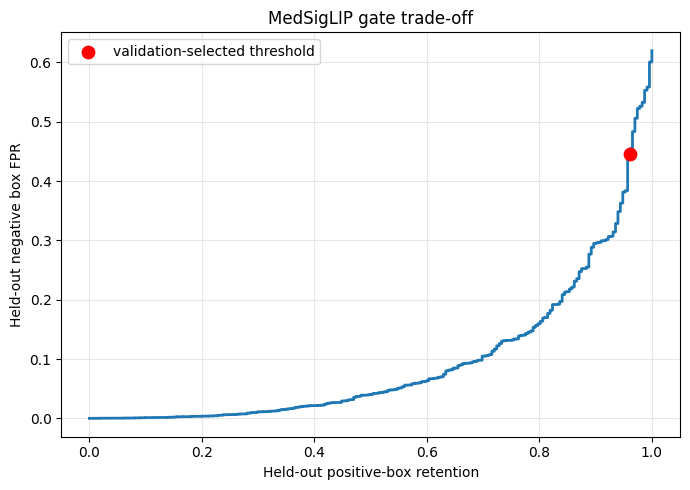

In [11]:
import matplotlib.pyplot as plt

test_neg = neg_df[neg_df["split"] == "negative_test"].copy()
thresholds = np.unique(np.r_[
    np.linspace(0, 1, 201),
    test_scores,
    test_neg["medsiglip_score"].to_numpy(),
])
curve = []
for t in thresholds:
    retention = float((test_scores >= t).mean())
    gated_fp = (
        test_neg["pga_positive"]
        & (test_neg["medsiglip_score"] >= t)
    )
    box_fpr = float(gated_fp.mean())
    curve.append((t, retention, box_fpr))
curve_df = pd.DataFrame(
    curve, columns=["threshold", "positive_retention", "negative_box_fpr"]
)
curve_df.to_csv(RESULTS_DIR / "test_tradeoff_curve.csv", index=False)

plt.figure(figsize=(7, 5))
plt.plot(
    curve_df["positive_retention"],
    curve_df["negative_box_fpr"],
    lw=2,
)
selected_fpr = float((
    test_neg["pga_positive"]
    & (test_neg["medsiglip_score"] >= MEDSIGLIP_THRESHOLD)
).mean())
plt.scatter(
    [float(test_retained.mean())], [selected_fpr],
    s=80, color="red", label="validation-selected threshold", zorder=3
)
plt.xlabel("Held-out positive-box retention")
plt.ylabel("Held-out negative box FPR")
plt.title("MedSigLIP gate trade-off")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.savefig(RESULTS_DIR / "test_tradeoff_curve.png", dpi=180)
plt.show()


## 9. Interpretation checklist

Consider including the result in the paper only if all statements below are defensible:

- The positive cohort was built from `PromptSegmentationDataset.all_samples`
  (not the legacy permissive parser), and the JSON-histogram-vs-loader
  counts in Section 4a matched or any mismatch was understood.
- The PGA preprocessing path (`letterbox`, `gaussian_prompt`) was compared
  against the checkpoint's training/eval dataset code, not just assumed
  equivalent.
- The threshold and text prompts were fixed without using the test outcomes.
- MedSigLIP lowers held-out box/image FPR by a practically meaningful
  amount, supported by the paired ΔFPR confidence interval, not just the
  before/after point estimates.
- Held-out positive-box retention remains acceptable, and any positive-side
  quality loss (e.g. future Dice/lesion-recall work) is reported alongside
  FPR rather than FPR alone.
- The number of negative images and box sampling protocol are reported,
  including that pixel foreground fraction is a full-square (padding
  included) quantity, not a valid-pixel-only FPR.
- Results are identified as a **post-segmentation gate**, not as a new segmentation model.
- The model ID, access terms, checkpoint version, checkpoint hash, repo
  commit, text prompts, crop rule, threshold rule, and random seed are
  reported (see `run_metadata.json` in the results directory).
- No clinical claim is made from simulated/random boxes.
- Duplicate-image and split-independence checks (Section 6a of this
  notebook) were reviewed, not just the hash-based split itself.

If FPR reduction is small, unstable, or obtained only by losing too many positive boxes, report MedSigLIP as future work rather than selecting a favorable threshold after seeing the test set.
